<h1 align="center">Portfolio Project</h1>
<h2 align="center">Credit Card Fraud Detection</h2>
<br>
<center align="center"> <font size='4'>Created by: </font><font size='4' color='#33AAFBD'>Truc Le </font>
</center>
</br>

### Credit Card Fraud Dectection Dataset
Credit card fraud refers to any dishonest act and behavior to commit theft using a credit card (or similar payment tool) as a fraudulent source of funds in a transaction. The objective is typically to obtain goods without paying or to obtain unauthorized funds from an account. Credit card fraud is a form of identity theft.

This dataset contains legitimate and fraud transactions from the duration Jan 1st, 2019 - Dec 31st, 2020. It covers credit cards of 10000 customers doing transactions with a pool of 800 merchants.

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Data Import</b></font>

In [2]:
!pip install tensorflow

     ------------------------------------- 276.5/276.5 MB 10.9 MB/s eta 0:00:00
     -------------------------------------- 126.5/126.5 kB 7.3 MB/s eta 0:00:00
     ---------------------------------------- 57.5/57.5 kB 3.0 MB/s eta 0:00:00
     ---------------------------------------- 65.5/65.5 kB 3.5 MB/s eta 0:00:00
     ---------------------------------------- 5.6/5.6 MB 59.1 MB/s eta 0:00:00
     ------------------------------------- 430.5/430.5 kB 26.3 MB/s eta 0:00:00
     ------------------------------------- 440.8/440.8 kB 26.9 MB/s eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 105.8 MB/s eta 0:00:00
     ---------------------------------------- 4.3/4.3 MB 92.9 MB/s eta 0:00:00
     --------------------------------------- 24.4/24.4 MB 40.9 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 47.6 MB/s eta 0:00:00
     ---------------------------------------- 181.8/181.8 kB ? eta 0:00:00
     -------------------------------------- 151.

In [28]:
!pip install shap

     -------------------------------------- 462.3/462.3 kB 7.3 MB/s eta 0:00:00


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import tensorflow as tf
import shap

from sklearn.neighbors import KernelDensity
from scipy.stats import anderson
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from category_encoders import CountEncoder,OneHotEncoder, TargetEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as imblearnPipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.feature_selection import SelectFromModel
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from scipy.stats import shapiro
from pandas_profiling import ProfileReport
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv1D, MaxPooling1D

%matplotlib inline

In [2]:
df = pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTrain.csv')
df = df.drop(df.columns[0], axis=1)

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Exploratory Data Analysis</b></font>

In [4]:
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [3]:
print (f' We have {df.shape[0]} instances with the {df.shape[1]-1} features and 1 output variable')

 We have 1296675 instances with the 21 features and 1 output variable


In [3]:
profile = ProfileReport(df)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 22 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   trans_date_trans_time  1296675 non-null  object 
 1   cc_num                 1296675 non-null  int64  
 2   merchant               1296675 non-null  object 
 3   category               1296675 non-null  object 
 4   amt                    1296675 non-null  float64
 5   first                  1296675 non-null  object 
 6   last                   1296675 non-null  object 
 7   gender                 1296675 non-null  object 
 8   street                 1296675 non-null  object 
 9   city                   1296675 non-null  object 
 10  state                  1296675 non-null  object 
 11  zip                    1296675 non-null  int64  
 12  lat                    1296675 non-null  float64
 13  long                   1296675 non-null  float64
 14  city_pop          

### Remarks:

- There are both numerical and categorical variables in the dataset.
- The most important column to look for is the target variable 'is_fraud'.
- 'is_fraud' is detected as binary value which is coded 1 for 'fraud' ads and 0 for 'no fraud'.

In [15]:
df.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06
mean,4.171920e+17,7.035104e+01,4.880067e+04,3.853762e+01,-9.022634e+01,8.882444e+04,1.349244e+09,3.853734e+01,-9.022646e+01,5.788652e-03
std,1.308806e+18,1.603160e+02,2.689322e+04,5.075808e+00,1.375908e+01,3.019564e+05,1.284128e+07,5.109788e+00,1.377109e+01,7.586269e-02
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902779e+01,-1.666712e+02,0.000000e+00
25%,1.800429e+14,9.650000e+00,2.623700e+04,3.462050e+01,-9.679800e+01,7.430000e+02,1.338751e+09,3.473357e+01,-9.689728e+01,0.000000e+00
50%,3.521417e+15,4.752000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.456000e+03,1.349250e+09,3.936568e+01,-8.743839e+01,0.000000e+00
75%,4.642255e+15,8.314000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.359385e+09,4.195716e+01,-8.023680e+01,0.000000e+00
max,4.992346e+18,2.894890e+04,9.978300e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.371817e+09,6.751027e+01,-6.695090e+01,1.000000e+00


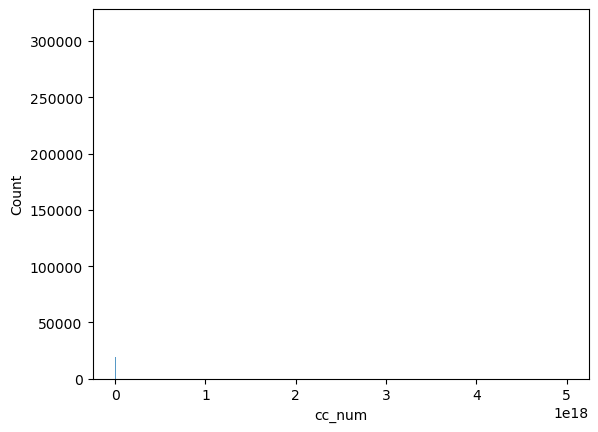

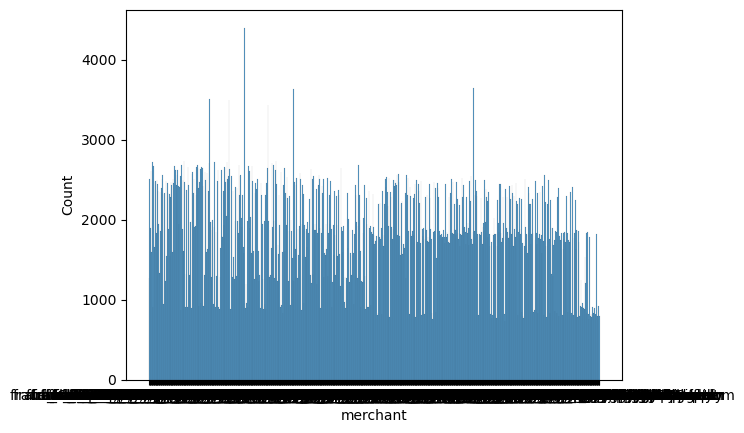

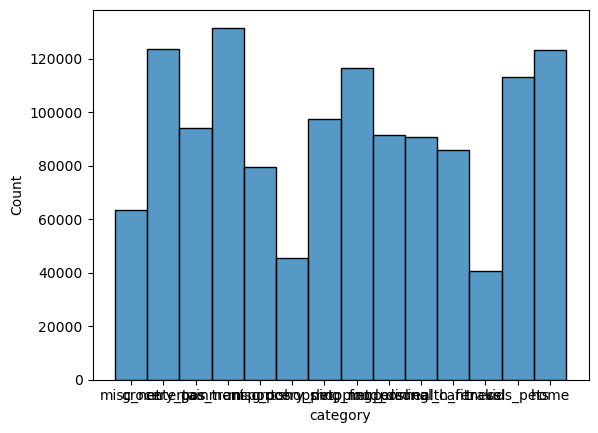

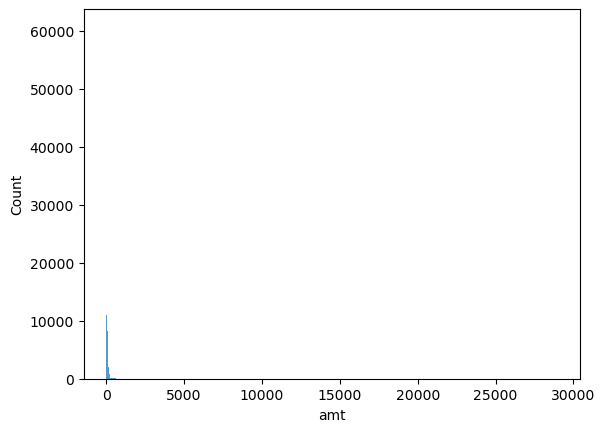

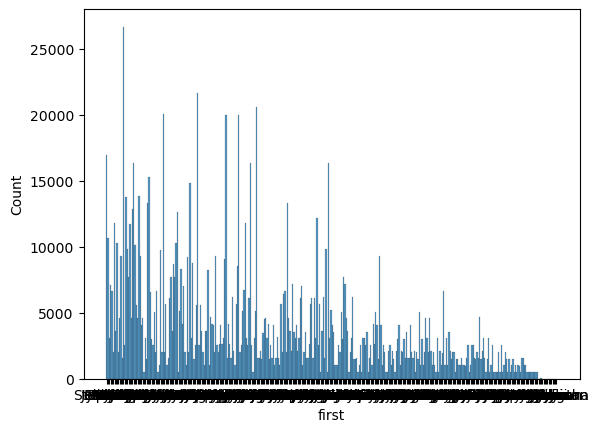

...

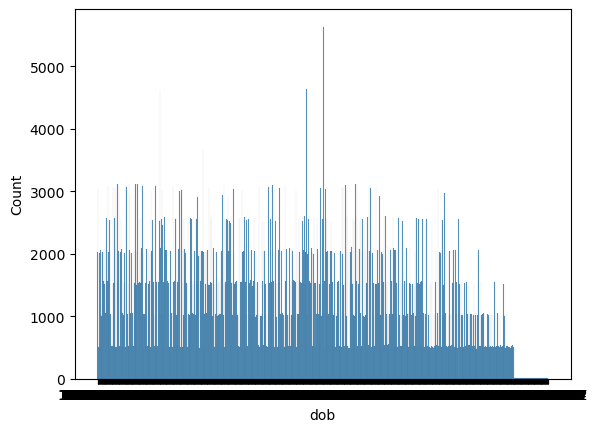

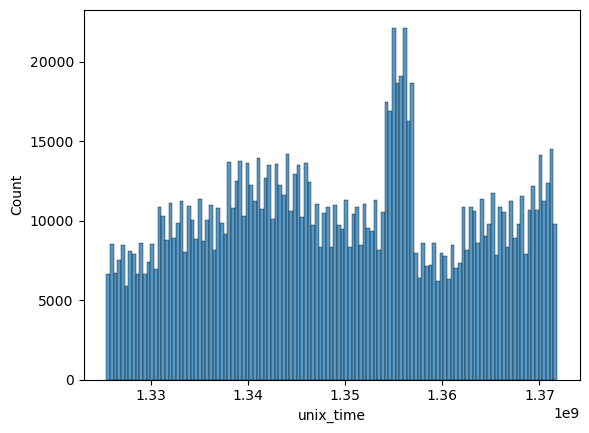

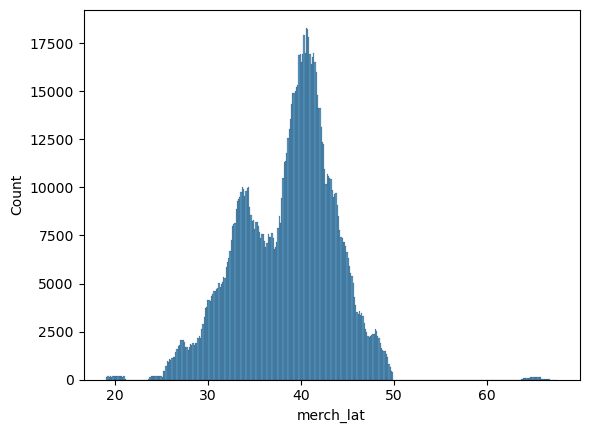

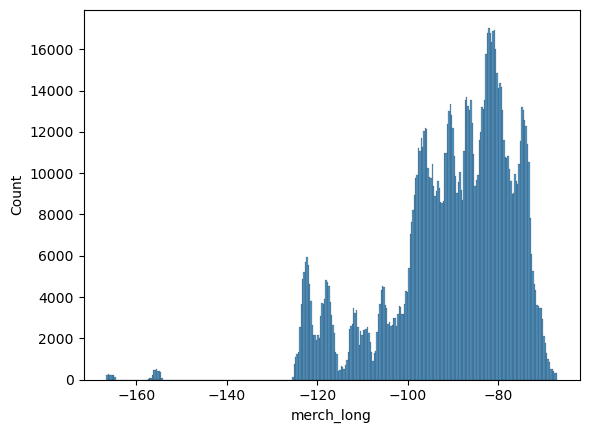

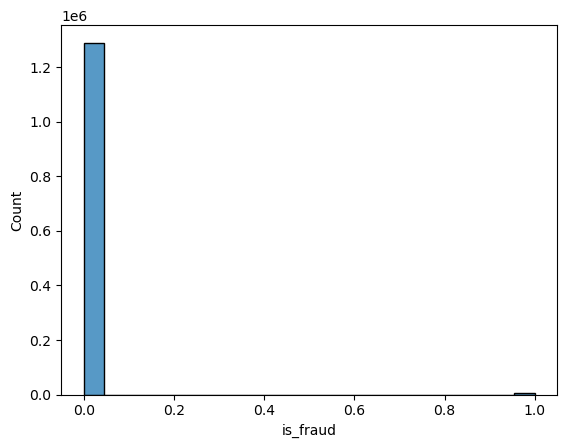

In [8]:
# Plot the distribution
for i, col in enumerate(df.columns):
    plt.figure(i)
    sns.histplot(df[col])

In [ ]:
# # Plot the distribution
# features = df.drop(columns=['trans_date_trans_time','cc_num','first','last','trans_num'])
# for i, col in enumerate(features.columns):
#     plt.figure(i)
#     sns.histplot(df[col])

In [24]:
# features = df.drop(columns=['trans_date_trans_time','merchant','category','first','last','gender','street',
#                             'city','state','job','dob','trans_num'])
skewed = []
for column in df.columns:
    if (df[column].dtype != 'object') & (df[column].dtype != 'bool'):  # Exclude non-numeric columns
        statistic, p_value = shapiro(df[column])
        alpha = 0.05
        if p_value < alpha:
           skewed.append(column)
print("These columns: ")
for column in skewed:
    print(f" {column} ")
print("are NOT normally distributed")

C:\Users\TrucLe\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


These columns: 
 cc_num 
 amt 
 zip 
 lat 
 long 
 city_pop 
 unix_time 
 merch_lat 
 merch_long 
 is_fraud 
are NOT normally distributed


In [5]:
skewed = []
for column in df.columns:
    if (df[column].dtype != 'object') & (df[column].dtype != 'bool'):  # Exclude non-numeric columns
        result = anderson(df[column])
        if result.statistic > result.critical_values[2]:  # Using 5% significance level
            skewed.append(column)

print("These columns: ")
for column in skewed:
    print(f" {column} ")
print("are NOT normally distributed")

These columns: 
 cc_num 
 amt 
 zip 
 lat 
 long 
 city_pop 
 unix_time 
 merch_lat 
 merch_long 
 is_fraud 
are NOT normally distributed


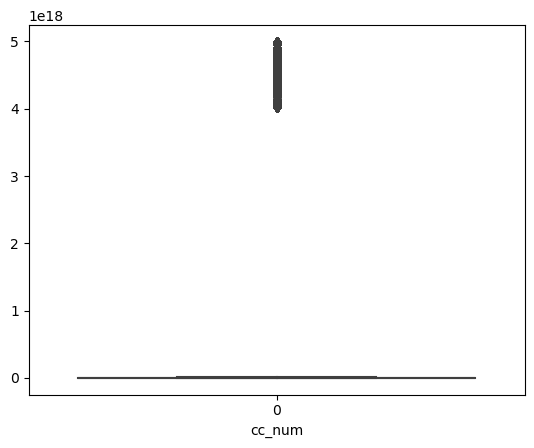

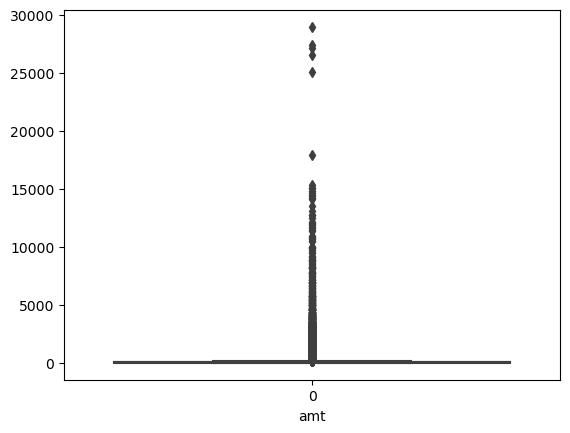

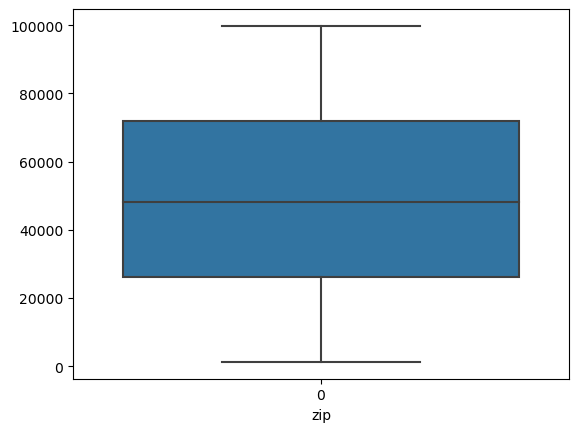

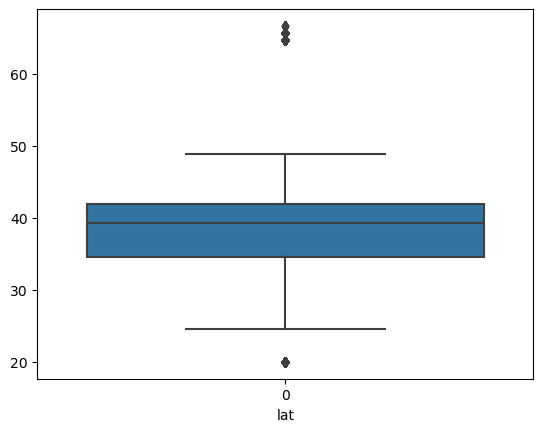

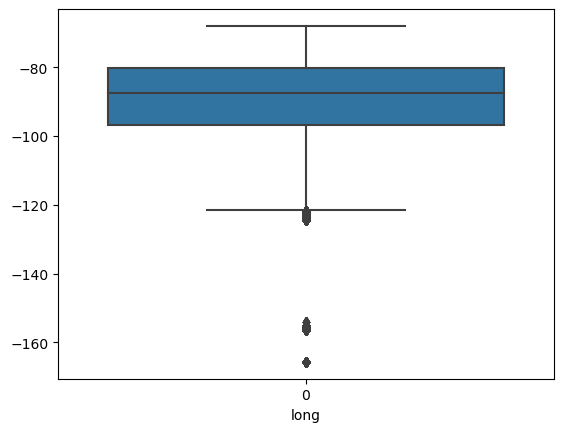

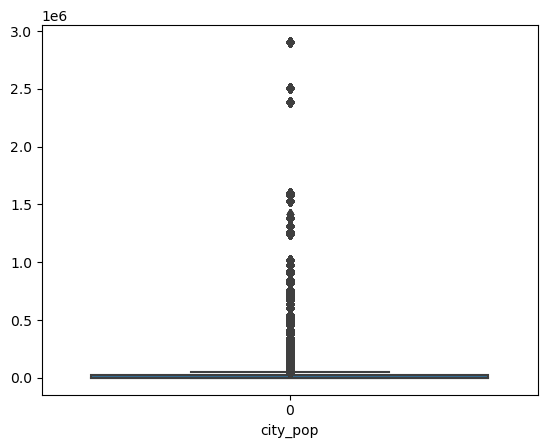

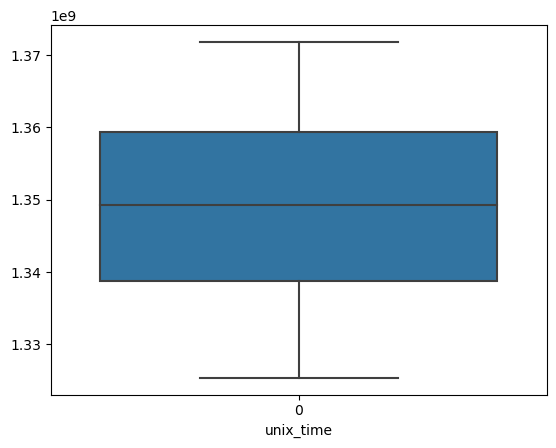

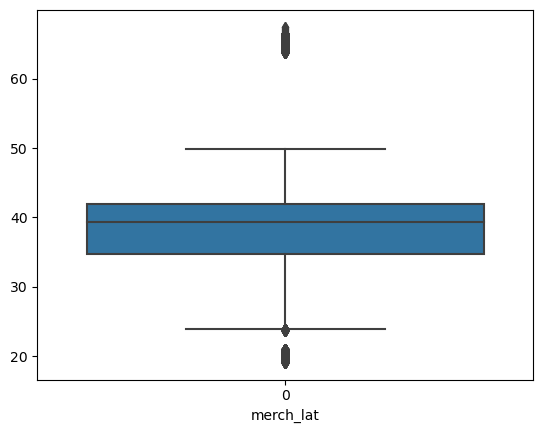

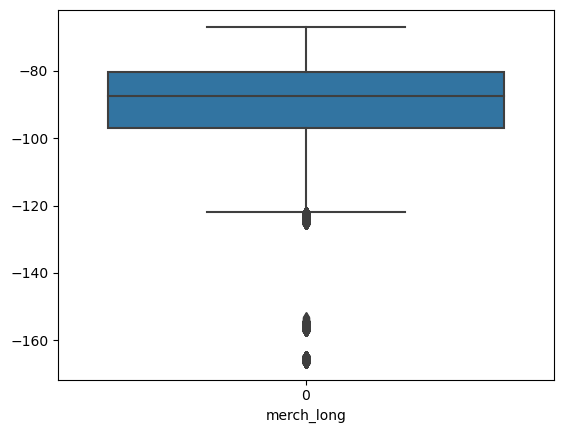

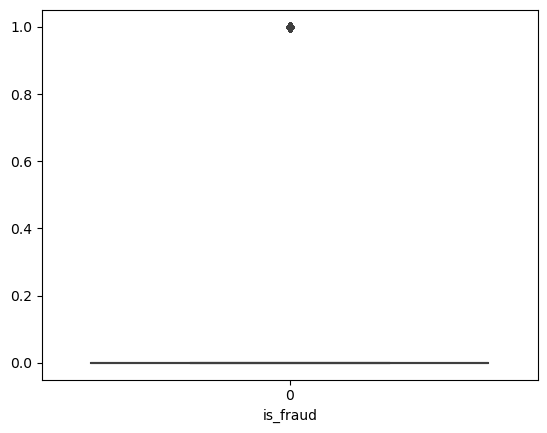

In [27]:
# features = df.drop(columns=['trans_date_trans_time','merchant','category','first','last','gender','street',
#                             'city','state','job','dob','trans_num'])
for i, col in enumerate(df.columns):
    if (df[col].dtype != 'object') & (df[col].dtype != 'bool'):  # Exclude non-numeric columns
        plt.figure(i)
        gf = sns.boxplot(data = df[col])
        gf.set_xlabel(col)

In [23]:
# Define the upper and lower bounds for outlier detection
outlier_multiplier = 1.5

# Loop through each column in the DataFrame and check for outliers using IQR
for column in df.columns:
    if (df[column].dtype != 'object') & (df[column].dtype != 'bool'):  # Exclude non-numeric columns
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + outlier_multiplier * IQR
        lower_bound = Q1 - outlier_multiplier * IQR
        has_outliers = any((df[column] < lower_bound) | (df[column] > upper_bound))
        print(f"{column}: {'Has outliers' if has_outliers else 'NO outliers'}")

cc_num: Has outliers
amt: Has outliers
zip: No outliers
lat: Has outliers
long: Has outliers
city_pop: Has outliers
unix_time: No outliers
merch_lat: Has outliers
merch_long: Has outliers
is_fraud: Has outliers


<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>Problem to Solve </b></font>

- We have **BINARY CLASSIFICATION PROBLEM**.
- We make prection on the target variable **IS_FRAUD**
- And we will build a model to get best prediction on the "is_fraud" variable.

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>Target Variable</b></font>

In [6]:
df['is_fraud'].value_counts()

0    1289169
1       7506
Name: is_fraud, dtype: int64

In [7]:
df['is_fraud'].value_counts(normalize=True)

0    0.994211
1    0.005789
Name: is_fraud, dtype: float64

In [9]:
y = df['is_fraud']
print(f'Percentage of transactions are fraud: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} transactions)\nPercentage of transactions are NOT fraud: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} transactions)')

Percentage of transactions are fraud: % 0.58 --> (7506 transactions)
Percentage of transactions are NOT fraud: % 99.42 --> (1289169 transactions)


### Remarks:
- 99.42% of the instances of our target variable is "NOT fraud"
- 1,289,169 transactions are NOT fraud
- 0.58% of the instances of our target variable is "fraud"
- 7,506 transactions are fraud

- We have imbalanced data.

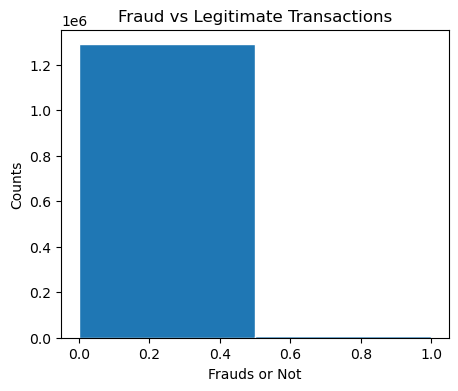

In [157]:
# Plot the distribution of fraud vs legitimate transactions
plt.figure(figsize=(5,4))
plt.hist(df['is_fraud'], bins=2, edgecolor='white')
plt.xlabel('Frauds or Not')
plt.ylabel('Counts')
plt.title('Fraud vs Legitimate Transactions');

### Remarks:
- There are approximately 171 times more 'no frauds' than 'frauds', so we can say that the 'no-frauds' class dominates the 'frauds' class
- Which is a strong indicator of class imbalance

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>Other Variables</b></font>

In [68]:
# Divide into categorical and numerical columns
categorical_cols = ['merchant','category','gender','street','city','state','job','dob']
numerical_cols = ['cc_num','amt','zip','lat','long','city_pop','unix_time','merch_lat','merch_long']

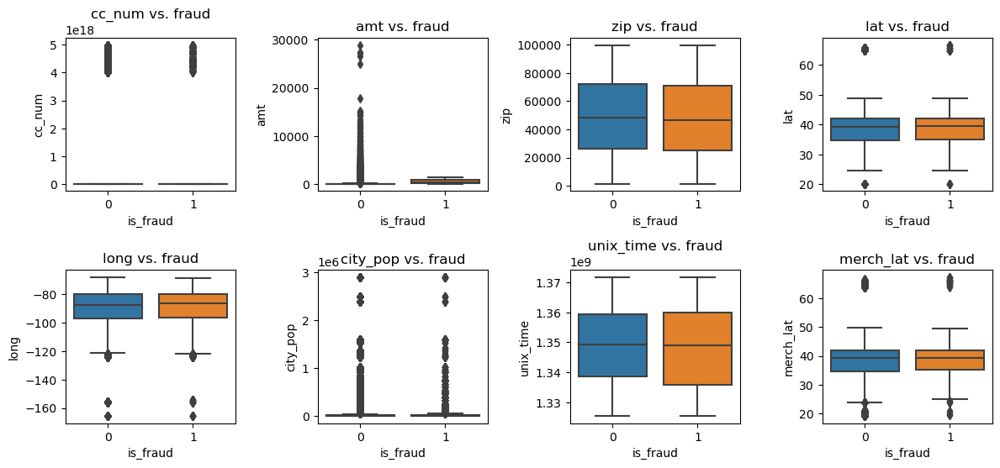

In [195]:
# Boxplot to visualize the distribution of numeric features for Fraud vs Not Fraud
plt.figure(figsize=(12, 8))  # Increase the height to prevent overlapping titles
for i, col in enumerate(numerical_cols[:-1]):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot layout
    sns.boxplot(x='is_fraud', y=col, data=df)
    plt.title(f'{col} vs. fraud')
    plt.xticks(rotation=0)  # Rotate the x-axis labels to avoid overlapping

plt.tight_layout()
plt.show()

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>1. Transaction Amount vs Fraud</b></font>

As the dataset is cleaned, we're now poised to explore the relationship between different features and fraud. Initially, we'll observe the distribution of transaction amounts in both fraudulent and legitimate activities. Given the presence of significant outliers in transaction amounts, with the 99th percentile at roughly 546 USD, we've limited the data to transaction amounts under 1,000 USD to enhance the clarity of our visualizations.

In [32]:
# Max and min transaction amount
min_value = df['amt'].min()
max_value = df['amt'].max()

print(f"Minimum value of 'amt': {min_value}")
print(f"Maximum value of 'amt': {max_value}")

Minimum value of 'amt': 1.0
Maximum value of 'amt': 28948.9


In [41]:
# Set max rows to None to display all rows without truncation
pd.set_option('display.max_rows', None)

print(df['amt'].value_counts())

# Reset the option back to default
pd.reset_option('display.max_rows')

1.14        542
1.04        538
1.25        535
1.02        533
1.01        523
1.05        519
1.20        516
1.23        515
1.08        512
1.11        509
1.10        506
1.41        506
1.12        505
1.22        503
1.03        499
1.07        498
1.09        496
1.16        496
1.42        495
1.28        494
1.40        493
1.17        493
1.27        493
1.54        492
1.53        488
1.70        487
1.24        486
1.35        482
1.33        482
1.32        482
1.48        480
1.31        480
1.26        479
1.37        477
1.44        475
1.19        474
1.64        472
1.45        472
1.66        471
1.18        471
1.06        471
1.52        469
1.60        468
1.57        466
1.21        464
1.47        464
1.15        462
1.50        462
1.13        462
1.78        462
1.43        460
1.80        459
1.71        459
1.91        458
1.55        457
1.76        456
1.79        456
1.63        456
1.81        455
2.07        454
2.06        454
1.75        453
1.29    

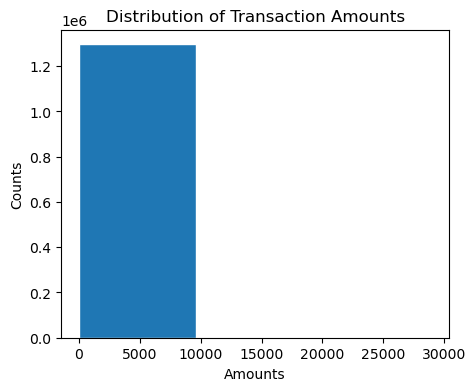

In [48]:
# Plot the distribution of transaction amounts
plt.figure(figsize=(5,4))
plt.hist(df['amt'], bins=3, edgecolor='white')
plt.xlabel('Amounts')
plt.ylabel('Counts')
plt.title('Distribution of Transaction Amounts');

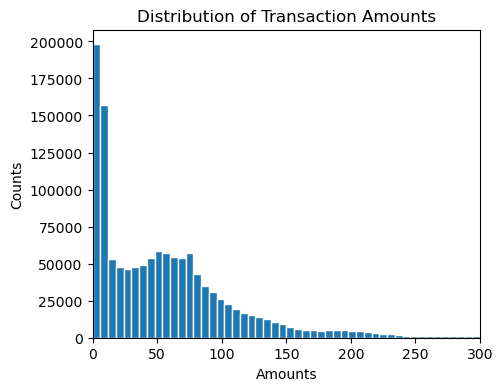

In [83]:
# Visualize the most common transaction amounts up to $300
plt.figure(figsize=(5,4))
plt.hist(df['amt'], bins=50, edgecolor='white', range=(0,300)) # changed bins to 50 for finer granularity
plt.xlabel('Amounts')
plt.ylabel('Counts')
plt.title('Distribution of Transaction Amounts')
plt.xlim([0, 300])
plt.show()


In [174]:
# Filter the data
fraud_data = df[(df.amt <= 1400) & (df.is_fraud == 1)]['amt']
not_fraud_data = df[(df.amt <= 1400) & (df.is_fraud == 0)]['amt']

# Create bins
bins = np.linspace(0, 1400, 26)

# Get the histogram values for fraud and not_fraud
fraud_hist, _ = np.histogram(fraud_data, bins=bins)
not_fraud_hist, _ = np.histogram(not_fraud_data, bins=bins)

# Convert the counts into percentages
fraud_percent = (fraud_hist / len(fraud_data)) * 100
not_fraud_percent = (not_fraud_hist / len(not_fraud_data)) * 100

# Build the resulting dataframe
result_df = pd.DataFrame({
    'Bin_Start': bins[:-1],
    'Bin_End': bins[1:],
    'Fraud_Percent': fraud_percent,
    'Not_Fraud_Percent': not_fraud_percent
})

print(result_df)

    Bin_Start  Bin_End  Fraud_Percent  Not_Fraud_Percent
0         0.0     56.0      21.929123          56.653477
1        56.0    112.0       0.506262          29.094368
2       112.0    168.0       1.505462           7.949273
3       168.0    224.0       0.373035           3.225839
4       224.0    280.0       4.076739           1.033654
5       280.0    336.0      17.132960           0.449729
6       336.0    392.0       4.409805           0.280042
7       392.0    448.0       0.626166           0.235232
8       448.0    504.0       0.852651           0.286332
9       504.0    560.0       0.759392           0.225602
10      560.0    616.0       0.586198           0.128683
11      616.0    672.0       1.119105           0.076961
12      672.0    728.0       2.424727           0.061973
13      728.0    784.0       5.462297           0.052343
14      784.0    840.0       5.941913           0.043101
15      840.0    896.0       6.608047           0.035258
16      896.0    952.0       7.

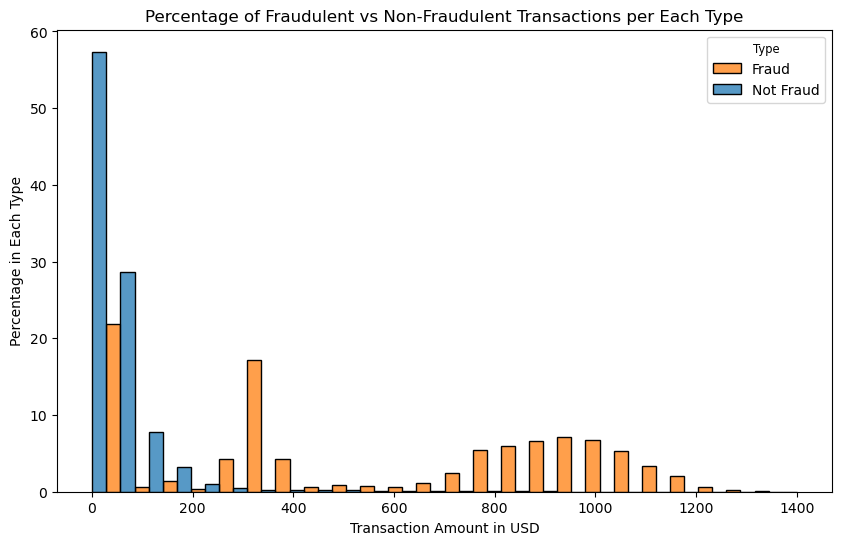

In [188]:
# Amount (up to $1400) vs Fraud
plt.figure(figsize=(10,6))
ax=sns.histplot(x='amt',data=df[df.amt<=1400],hue='is_fraud',stat='percent',multiple='dodge',common_norm=False,
                bins=25,shrink=1)
ax.set_ylabel('Percentage in Each Type')
ax.set_xlabel('Transaction Amount in USD')
plt.title("Percentage of Fraudulent vs Non-Fraudulent Transactions per Each Type")
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])

### Remarks:

From the provided data on transaction amounts (binned) and their corresponding fraudulent and non-fraudulent percentages, here are some insights:

- **Initial Spike**: In the smallest transaction amount range (0.0, 56.0] USD, fraud rate is considerably high at almost 22%. In comparison, the non-fraud rate is 56.65%, which is the highest across all bins.

- **Major Non-Fraud Decrease**: In the second bin, (56.0, 112.0] USD, while the fraud rate is only 0.51%, the non-fraud rate drops significantly to 29.09%.

- **Notable Fraud Rise**: Between (224.0, 280.0] USD and (280.0, 336.0] USD, the fraud rate surges dramatically from 4.08% to 17.13% respectively, even as non-fraud rates remain low.

- **Steady High Fraud Rate**: Between the bins (728.0, 784.0] USD and (896.0, 952.0] USD, fraud percentages stay noticeably elevated, hovering around 5-7%.

- **Decline in Fraud**: After the (952.0, 1008.0] USD bin, there's a discernible decrease in fraud rates, eventually dropping to just 0.03% in the (1344.0, 1400.0] USD bin.

- **Diminishing Non-Fraud Rates**: Post the initial (0.0, 56.0] USD bin, non-fraud rates see a consistent reduction, reaching as low as 0.01% in the higher transaction bins.

In summary, while initial small transaction amounts see a mix of high fraud and non-fraud rates, there's a prominent surge in fraud rates in the middle transaction values. The latter higher amounts mostly witness diminishing percentages in both categories, with fraud rates especially low in the highest transaction bins.

In [150]:
# Set max rows to None to display all rows without truncation
pd.set_option('display.max_rows', None)

# Create bins
bin_ranges = pd.interval_range(start=0, end=1400, freq=40) # Assuming the bin size you want is 40, you can adjust it accordingly
df['amt_bins'] = pd.cut(df['amt'], bins=bin_ranges)

# Group by these bins and calculate the percentages of fraudulent vs non-fraudulent transactions
grouped = df[df.amt <= 1400].groupby(['amt_bins', 'is_fraud']).size().unstack().fillna(0)

# Calculate the percentages
grouped['total'] = grouped[0] + grouped[1]
grouped['percent_fraud'] = (grouped[1] / grouped['total']) * 100
grouped['percent_not_fraud'] = (grouped[0] / grouped['total']) * 100

# Final table
table = grouped[['percent_fraud', 'percent_not_fraud']]
print(table)

# Reset the option back to default
pd.reset_option('display.max_rows')

is_fraud      percent_fraud  percent_not_fraud
amt_bins                                      
(0, 40]            0.268036          99.731964
(40, 80]           0.023066          99.976934
(80, 120]          0.044531          99.955469
(120, 160]         0.099146          99.900854
(160, 200]         0.014780          99.985220
(200, 240]         0.261245          99.738755
(240, 280]         3.566315          96.433685
(280, 320]        17.826167          82.173833
(320, 360]        15.619742          84.380258
(360, 400]         4.111776          95.888224
(400, 440]         1.501642          98.498358
(440, 480]         1.615385          98.384615
(480, 520]         1.728111          98.271889
(520, 560]         2.022245          97.977755
(560, 600]         2.743902          97.256098
(600, 640]         4.027618          95.972382
(640, 680]        10.176391          89.823609
(680, 720]        20.291971          79.708029
(720, 760]        32.400000          67.600000
(760, 800]   

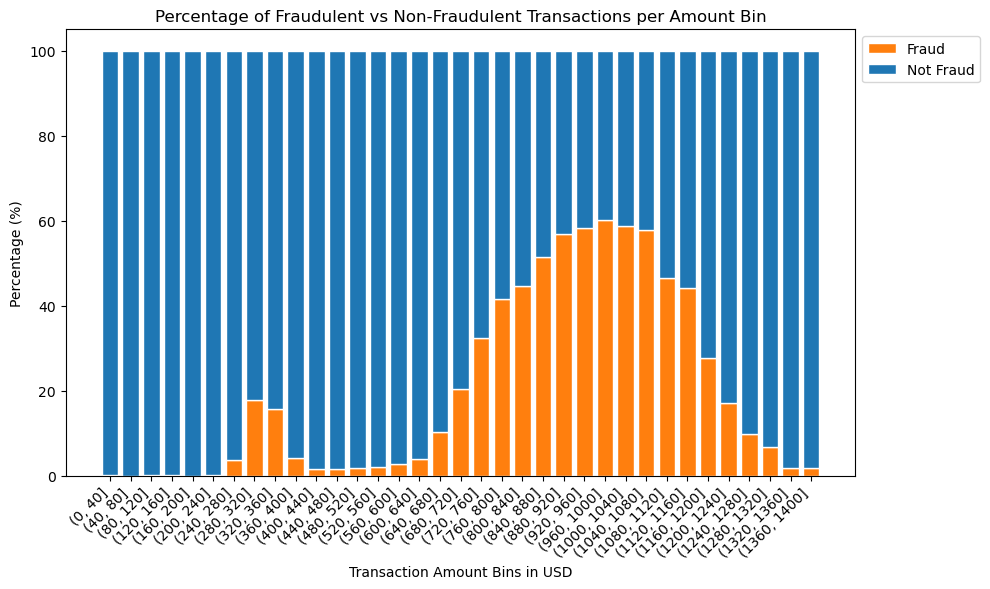

In [152]:
# Data
bars1 = grouped['percent_fraud']
bars2 = grouped['percent_not_fraud']

# Position of bars on x-axis
r = list(range(len(bars1)))

plt.figure(figsize=(10,6))
# Create blue bars (fraudulent)
plt.bar(r, bars1, color='#ff7f0e', edgecolor='white', label='Fraud')

# Create red bars (non-fraudulent), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#1f77b4', edgecolor='white', label='Not Fraud')

# Custom X axis
plt.xticks(r, [str(interval) for interval in grouped.index], rotation=45, ha="right")
plt.xlabel("Transaction Amount Bins in USD")
plt.ylabel("Percentage (%)")
plt.title("Percentage of Fraudulent vs Non-Fraudulent Transactions per Amount Bin")
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

# Show graphic
plt.tight_layout()
plt.show()

### Remarks:

Examining the given data on the percentage distribution of fraudulent and non-fraudulent transactions within specific transaction amount bins:

- **Predominantly Safe Lower Amounts**: For transaction amounts up to 240 USD, fraud rates remain exceedingly low, mostly below 0.27%.

- **Noticeable Fraud Surge**: Starting from the (240, 280] USD range, fraud rates jump significantly, reaching 3.57% and escalating further to a peak of 60.07% in the (960, 1000] USD bracket.

- **Moderation Beyond 1000 USD**: Interestingly, after breaching the 1000 USD mark, fraud rates show a gradual decline, moving from 58.82% in the (1000, 1040] USD range down to a mere 1.77% in the (1360, 1400] USD bracket.

- **High-Risk Zones**: Transaction amounts between (280, 1000] USD are particularly susceptible to fraud, with the rate often surpassing 15% and occasionally even 50%.

- **Respite in Higher Amounts**: Beyond 1120 USD, there's a noticeable decline in fraud percentages, suggesting perhaps tighter controls or lesser fraudulent activity in these higher transaction values.

In summary, while smaller transaction amounts largely pose low risk, amounts from 240 to 1000 USD demand higher scrutiny. Beyond $1120, the risk again diminishes, signaling potentially better safeguards or patterns in higher transaction values.

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>2. Gender vs Fraud</b></font>

Second, we'll investigate if one gender is more prone to fraud compared to the other.

In [84]:
df['gender'].value_counts()

F    709863
M    586812
Name: gender, dtype: int64

In [86]:
df['gender'].value_counts(normalize=True)

F    0.547449
M    0.452551
Name: gender, dtype: float64

In [167]:
# Count the total occurrences for each gender
gender_total = df.groupby('gender').size()

# Count occurrences of fraud and not fraud for each gender
fraud_counts = df.groupby(['gender', 'is_fraud']).size().unstack().fillna(0)

# Compute percentages
fraud_counts['Fraud (%)'] = (fraud_counts[1] / gender_total) * 100
fraud_counts['Not Fraud (%)'] = (fraud_counts[0] / gender_total) * 100

# Create a data table containing only the percentages
data_table = fraud_counts[['Fraud (%)', 'Not Fraud (%)']]

print(data_table)

is_fraud  Fraud (%)  Not Fraud (%)
gender                            
F          0.526158      99.473842
M          0.642625      99.357375


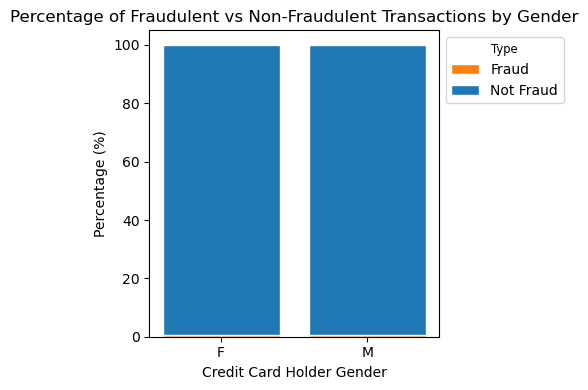

In [168]:
bars1 = data_table['Fraud (%)']
bars2 = data_table['Not Fraud (%)']

# Position of bars on x-axis
r = list(range(len(bars1)))

plt.figure(figsize=(5,4))
# Create blue bars (fraudulent)
plt.bar(r, bars1, color='#ff7f0e', edgecolor='white', label='Fraud')

# Create orange bars (non-fraudulent), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#1f77b4', edgecolor='white', label='Not Fraud')

# Custom X axis
plt.xticks(r, data_table.index)
plt.xlabel("Credit Card Holder Gender")
plt.ylabel("Percentage (%)")
plt.title("Percentage of Fraudulent vs Non-Fraudulent Transactions by Gender")
plt.legend(title = 'Type', loc="upper left", bbox_to_anchor=(1,1))

# Show graphic
plt.tight_layout()
plt.show()


### Remarks:
Men have a slightly higher fraud rate (0.64%) compared to women (0.53%), though both genders exhibit a very high percentage of non-fraudulent transactions, exceeding 99% in both cases.

In [172]:
# Count of fraud and non-fraud cases
fraud_total = df[df['is_fraud'] == 1].shape[0]
not_fraud_total = df[df['is_fraud'] == 0].shape[0]

# Count of each gender within fraud and non-fraud
gender_fraud_counts = df[df['is_fraud'] == 1].groupby('gender').size()
gender_not_fraud_counts = df[df['is_fraud'] == 0].groupby('gender').size()

# Compute percentages
gender_fraud_counts_percentage = (gender_fraud_counts / fraud_total) * 100
gender_not_fraud_counts_percentage = (gender_not_fraud_counts / not_fraud_total) * 100

# Combine into a data table
data_table = pd.DataFrame({
    'Fraud (%)': gender_fraud_counts_percentage,
    'Not Fraud (%)': gender_not_fraud_counts_percentage
})
print(data_table)

        Fraud (%)  Not Fraud (%)
gender                          
F       49.760192      54.773889
M       50.239808      45.226111


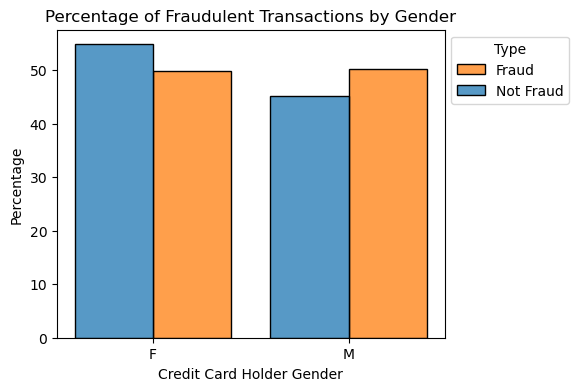

In [3]:
# Gender vs Fraud
plt.figure(figsize=(5,4))
ax = sns.histplot(x='gender', data=df, hue='is_fraud', stat='percent', multiple='dodge', common_norm=False, shrink=0.8)
ax.set_ylabel('Percentage')
ax.set_xlabel('Credit Card Holder Gender')
# Position legend in center
ax.legend(title='Type', labels=['Fraud', 'Not Fraud'], loc='upper left', bbox_to_anchor=(1,1))  
plt.title("Percentage of Fraudulent Transactions by Gender")
plt.show()

### Remarks:
Women account for approximately 49.76% of the fraudulent transactions and 54.77% of the non-fraudulent ones, while men represent a slightly higher 50.24% of the fraud cases but only 45.23% of the non-fraudulent transactions. This suggests that while men slightly lead in fraudulent activities, women dominate in legitimate transactions.

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>3. Category vs Fraud</b></font>

Third, we investigate the spending categories where fraud is most prevalent. We begin by determining the distribution of regular transactions and then contrast it with the distribution of fraudulent ones. The disparity between these two distributions will highlight the category most vulnerable to fraud. For instance, if 'grocery_pos' represents 50% in both regular and fraudulent transactions, it doesn't necessarily indicate a high fraud tendency; it just signifies its general popularity. Conversely, if it's 10% in regular transactions but 30% in fraudulent ones, a discernible pattern emerges.

In [37]:
# Extract non-fraudulent transaction category percentages
a = df[df['is_fraud'] == 0]['category'].value_counts(normalize=True).to_frame().reset_index()
a.columns = ['category', 'not fraud percentage']

# Extract fraudulent transaction category percentages
b = df[df['is_fraud'] == 1]['category'].value_counts(normalize=True).to_frame().reset_index()
b.columns = ['category', 'fraud percentage']

# Merge the two dataframes on the category column
ab = a.merge(b, on='category')

# Calculate the difference between fraud and non-fraud percentages
ab['diff'] = ab['fraud percentage'] - ab['not fraud percentage']

# Display the dataframe (or save to a variable)
ab = ab.sort_values('diff', ascending=False)
ab

,category,not fraud percentage,fraud percentage,diff
5,shopping_net,0.074335,0.228217,0.153883
2,grocery_pos,0.094553,0.232214,0.137661
11,misc_net,0.048382,0.121902,0.073521
3,shopping_pos,0.089848,0.112310,0.022462
13,travel,0.031331,0.015454,-0.015877
12,grocery_net,0.035153,0.017852,-0.017300
0,gas_transport,0.101648,0.082334,-0.019314
10,misc_pos,0.061594,0.033307,-0.028287
8,personal_care,0.070230,0.029310,-0.040920
6,entertainment,0.072745,0.031042,-0.041703


Text(0.5, 1.0, 'The Percentage Difference of Fraudulent over Non-Fraudulent Transations in Each Transaction Category ')

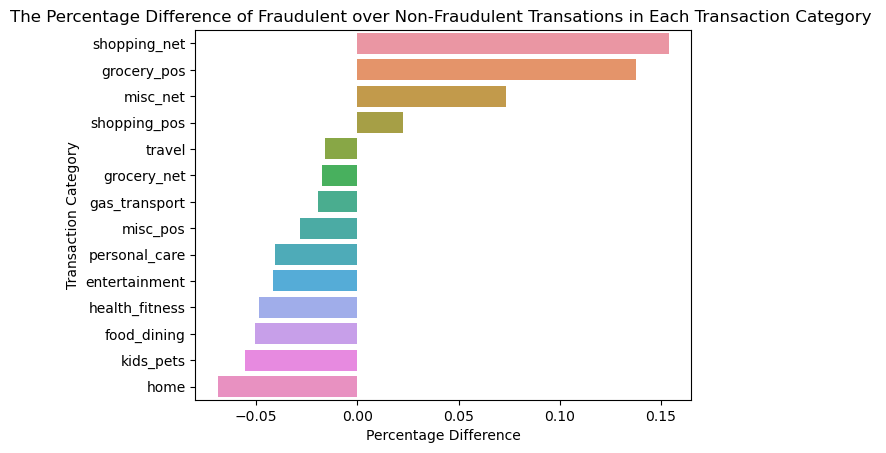

In [3]:
# Calculate the percentage difference
a=df[df['is_fraud']==0]['category'].value_counts(normalize=True).to_frame().reset_index()
a.columns=['category','not fraud percentage']

b=df[df['is_fraud']==1]['category'].value_counts(normalize=True).to_frame().reset_index()
b.columns=['category','fraud percentage']
ab=a.merge(b,on='category')
ab['diff']=ab['fraud percentage']-ab['not fraud percentage']

ax=sns.barplot(y='category',x='diff',data=ab.sort_values('diff',ascending=False))
ax.set_xlabel('Percentage Difference')
ax.set_ylabel('Transaction Category')
plt.title('The Percentage Difference of Fraudulent over Non-Fraudulent Transations in Each Transaction Category ')

### Remarks:
Transactions categorized as "shopping_net" and "grocery_pos" have the highest percentage difference, indicating a significant increase in fraudulent activity compared to non-fraudulent transactions in these categories. Conversely, "home" and "kids_pets" categories show the largest negative differences, suggesting that they are less prone to fraudulent transactions compared to their non-fraudulent counterparts.

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>4. State vs Fraud</b></font>

Having analyzed fraud over time, let's delve into the geographic areas most susceptible to fraud. We'll employ the approach we used in Part 3, comparing the geographical distribution differences between the two types of transactions.

In [68]:
# State vs Fraud
# Getting normalized value counts for Non-Fraudulent transactions
a = df['state'][df.is_fraud==0].value_counts(normalize=True) * 100
a = a.to_frame()
a = a.reset_index()
a.columns = ['State', 'Non-Fraud Percentage']

# Getting normalized value counts for Fraudulent transactions
b = df['state'][df.is_fraud==1].value_counts(normalize=True) * 100
b = b.to_frame()
b = b.reset_index()
b.columns = ['State', 'Fraud Percentage']

# Merging the two dataframes on the 'State' column
merged = a.merge(b, on='State')

# Calculating the Percentage Difference
merged['Percentage Difference'] = merged['Fraud Percentage'] - merged['Non-Fraud Percentage']

# Sorting the merged dataframe bsed on the Percentage Difference
merged = merged.sort_values('Percentage Difference', ascending=False)

# Displaying the table
print(merged[['State', 'Non-Fraud Percentage', 'Fraud Percentage', 'Percentage Difference']])

   State  Non-Fraud Percentage  Fraud Percentage  Percentage Difference
1     NY              6.434067          7.394085               0.960018
4     OH              3.580524          4.276579               0.696055
30    OR              1.430999          1.985079               0.554079
24    NE              1.860734          2.398082               0.537348
31    TN              1.350793          1.865175               0.514382
7     FL              3.288165          3.743672               0.455507
35    CO              1.067897          1.505462               0.437565
14    VA              2.253545          2.637890               0.384345
15    SC              2.249278          2.571276               0.321998
48    AK              0.161655          0.479616               0.317962
32    ME              1.271051          1.585398               0.314347
10    MN              2.443977          2.757794               0.313816
25    KS              1.771684          2.078337               0

Text(0.5, 1.0, 'The Percentage of Fraudulent over Non-Fraudulent Transcations in Each State')

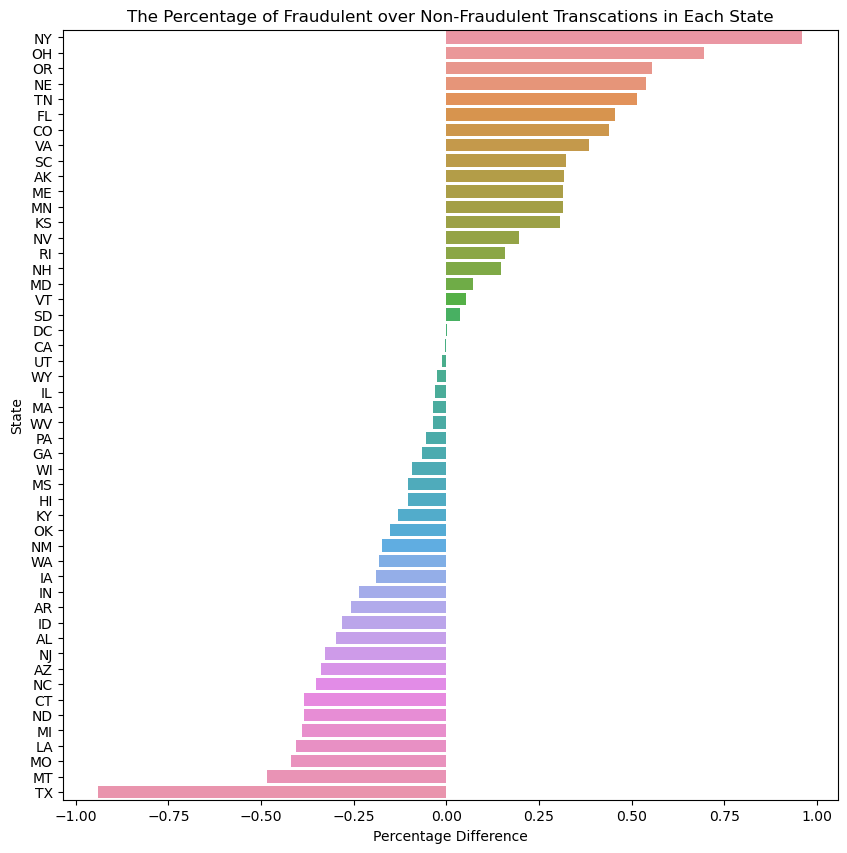

In [67]:
# State vs Fraud
a=df['state'][df.is_fraud==0].value_counts(normalize=True)
a=a.to_frame()
a=a.reset_index()
a.columns = ['State', 'Per']

b=df['state'][df.is_fraud==1].value_counts(normalize=True)
b=b.to_frame()
b=b.reset_index()
b.columns = ['State', 'Per']
merged=a.merge(b,on='State')
merged['diff']=merged['Per_y']-merged['Per_x']
merged['diff']=merged['diff']*100
merged=merged.sort_values('diff',ascending=False)

plt.figure(figsize=(10,10))
ax1=sns.barplot(data=merged, x='diff',y='State')
ax1.set_xlabel('Percentage Difference')
ax1.set_ylabel('State')
plt.title('The Percentage of Fraudulent over Non-Fraudulent Transcations in Each State')

### Remarks:
In examining the relationship between states and fraud percentages, New York (NY) and OH (Ohio) has the highest positive difference, with a 0.96% and 0.69% higher rate of fraudulent transactions compared to non-fraudulent ones. Conversely, Texas (TX) and MT (Montana) exhibits the largest negative difference, where the fraud percentage is 0.94% and 0.48% less than its non-fraud counterpart.

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Feature Engineering</b></font>
- Create new features: age, hour, day of week, month

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>5. Age vs Fraud</b></font>

In [4]:
# Create new feature 'age' based on 'dob'
df['age'] = dt.date.today().year - pd.to_datetime(df['dob']).dt.year

In [8]:
# Age vs Fraud
# Create the age bins
bins = np.arange(0, 105, 5)
df['age_bins'] = pd.cut(df['age'], bins=bins, right=False, include_lowest=True)

# Calculate the percentage for each age bin for fraudulent and non-fraudulent transactions
grouped = df.groupby(['age_bins', 'is_fraud']).size().unstack(fill_value=0)
grouped_percentage = (grouped / grouped.sum()) * 100

# Rename columns for clarity
grouped_percentage.columns = ['Not Fraud Percentage', 'Fraud Percentage']
grouped_percentage.reset_index(inplace=True)

# Remove the age_bins column and use the left edge of the bin interval as the age representative
# grouped_percentage['Age'] = grouped_percentage['age_bins'].apply(lambda x: x.left)
grouped_percentage['Age'] = grouped_percentage['age_bins']
grouped_percentage.drop('age_bins', axis=1, inplace=True)
grouped_percentage = grouped_percentage[['Age', 'Not Fraud Percentage', 'Fraud Percentage']]

print(grouped_percentage)

          Age  Not Fraud Percentage  Fraud Percentage
0      [0, 5)              0.000000          0.000000
1     [5, 10)              0.000000          0.000000
2    [10, 15)              0.000000          0.000000
3    [15, 20)              0.730393          0.519584
4    [20, 25)              2.924597          3.090861
5    [25, 30)              6.898630          7.593925
6    [30, 35)              9.690351          9.445777
7    [35, 40)             13.705263          9.552358
8    [40, 45)              8.551167          6.901146
9    [45, 50)             11.821181          8.992806
10   [50, 55)             11.619656          9.778844
11   [55, 60)              7.523374          9.325873
12   [60, 65)              6.643737          9.059419
13   [65, 70)              5.979744          7.394085
14   [70, 75)              3.985979          4.196643
15   [75, 80)              2.998443          2.984279
16   [80, 85)              2.460732          4.609646
17   [85, 90)              1

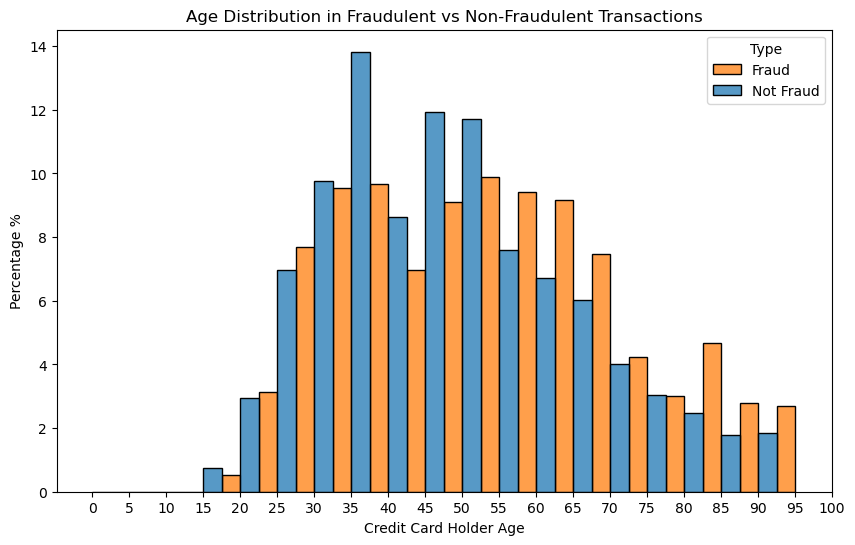

In [6]:
# Age vs Fraud
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='age', hue='is_fraud', bins=np.arange(0, 100, 5), multiple="dodge", stat="percent", common_norm=False)
plt.xlabel('Credit Card Holder Age')
plt.ylabel('Percentage %')
plt.xticks(np.arange(0, 105, 5))
plt.title('Age Distribution in Fraudulent vs Non-Fraudulent Transactions')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])
plt.show()

### Remarks:
The highest percentage of non-fraudulent transactions occur within the age bin of 35-40 years, accounting for approximately 13.63% of the total. Meanwhile, the proportion of fraudulent transactions remains relatively consistent across age groups, hovering around 0.05% for most age bins, with no detectable spikes in any specific age range.

<a id="4"></a>
<font color="#33AAFBD" size=+1.5><b>6. Cyclicality of Credit Card Fraud</b></font>

How are fraudulent transactions spread out over time? Are there any patterns on an hourly, monthly, or seasonal basis? The transaction time column can help us explore this.

### Hourly Trend

In [5]:
# Create new feature 'hour' from 'trans_date_trans_time'
df['hour']=pd.to_datetime(df['trans_date_trans_time']).dt.hour

In [98]:
# Hour vs Fraud

# Getting counts for non-fraudulent transactions by hour
non_fraud_counts = df[df['is_fraud'] == 0]['hour'].value_counts(normalize=True) * 100

# Getting counts for fraudulent transactions by hour
fraud_counts = df[df['is_fraud'] == 1]['hour'].value_counts(normalize=True) * 100

# Creating a DataFrame
hourly_data = pd.DataFrame({
    'Hour in a Day': np.arange(0, 24, 1),
    'Not Fraud Percentage': non_fraud_counts.sort_index(),
    'Fraud Percentage': fraud_counts.sort_index()
}).reset_index(drop=True)

print(hourly_data)


    Hour in a Day  Not Fraud Percentage  Fraud Percentage
0               0              3.247596          8.459899
1               1              3.274280          8.766320
2               2              3.260317          8.326672
3               3              3.270324          8.113509
4               4              3.243717          0.612843
5               5              3.266523          0.799361
6               6              3.278081          0.532907
7               7              3.269315          0.746070
8               8              3.293284          0.652811
9               9              3.268617          0.626166
10             10              3.275831          0.532907
11             11              3.261015          0.559552
12             12              5.056746          0.892619
13             13              5.060159          1.065814
14             14              5.026416          1.145750
15             15              5.066209          1.052491
16            

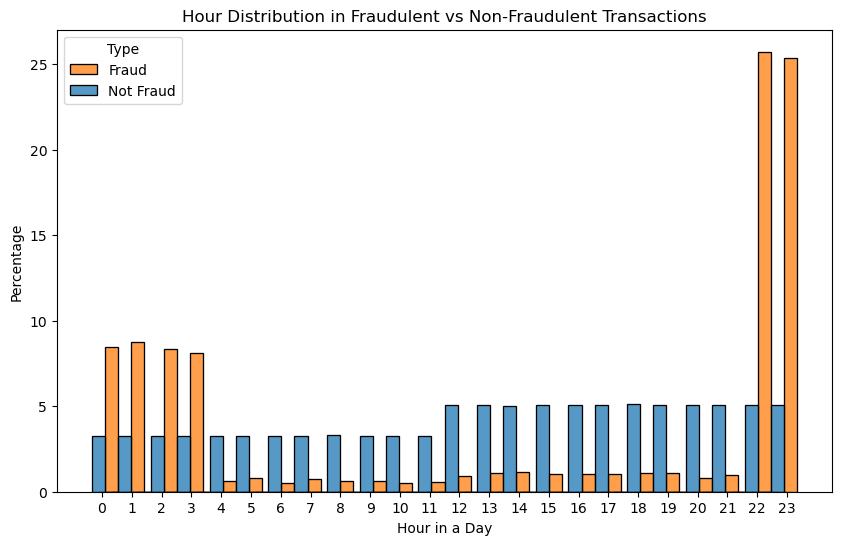

In [88]:
# Hour vs Fraud
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='hour', hue='is_fraud', multiple="dodge", stat="percent", common_norm=False, shrink=4)
plt.xlabel('Hour in a Day')
plt.ylabel('Percentage')
plt.xticks(np.arange(0, 24, 1))
plt.title('Hour Distribution in Fraudulent vs Non-Fraudulent Transactions')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])
plt.show()

### Remarks:
Between midnight and 3 am, there's a noticeably higher percentage of fraudulent transactions compared to non-fraudulent ones. Notably, at 10 pm and 11 pm, fraudulent transactions surge to approximately 25% of the total, vastly outnumbering the non-fraudulent transactions during those hours.

### Weekly Trend

In [6]:
# Create new feature 'day' from 'trans_date_trans_time'
df['day'] = pd.to_datetime(df['trans_date_trans_time']).dt.dayofweek

In [93]:
# Day of Week vs Fraud

# Count the number of fraud and non-fraud transactions for each day
day_counts = df.groupby(['day', 'is_fraud']).size().unstack().fillna(0)

# Calculate the percentages for fraud and non-fraud for each day
total_fraud = day_counts[1].sum()
total_non_fraud = day_counts[0].sum()

day_counts['Not Fraud Percentage'] = (day_counts[0] / total_non_fraud) * 100
day_counts['Fraud Percentage'] = (day_counts[1] / total_fraud) * 100

# Extract only the necessary columns and reset index
day_percentages = day_counts[['Not Fraud Percentage', 'Fraud Percentage']].reset_index()

# Replace numerical days with day names
day_mapping = {0: "Mon", 1: "Tue", 2: "Wed", 3: "Thu", 4: "Fri", 5: "Sat", 6: "Sun"}
day_percentages['day'] = day_percentages['day'].map(day_mapping)

print(day_percentages)

is_fraud  day  Not Fraud Percentage  Fraud Percentage
0         Mon             19.632802         15.747402
1         Tue             12.356177         12.456701
2         Wed             10.100615         11.444178
3         Thu             11.346612         13.429257
4         Fri             11.727943         14.375167
5         Sat             15.492926         16.346922
6         Sun             19.342926         16.200373


C:\Users\TrucLe\AppData\Local\Temp\ipykernel_22484\3771323129.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['',"Mon","Tue","Wed","Thu","Fri","Sat","Sun"])


Text(0.5, 1.0, 'Distribution in Fraudulent vs Non-Fraudulent Transactions')

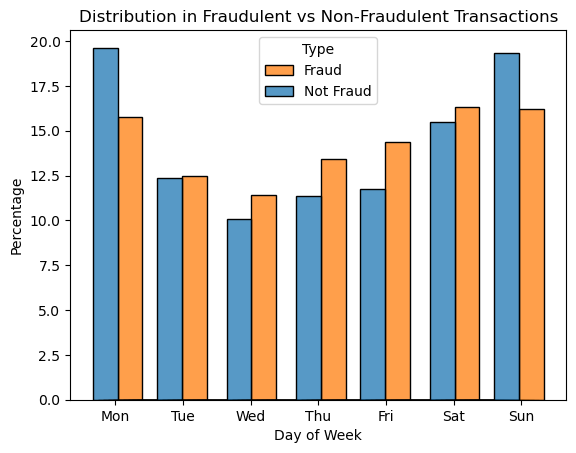

In [94]:
# Day of week vs fraud
ax=sns.histplot(data=df, x="day", hue="is_fraud", common_norm=False,stat='percent',multiple='dodge',shrink=10)
ax.set_xticklabels(['',"Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
ax.set_ylabel('Percentage')
ax.set_xlabel('Day of Week')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])
plt.title('Day of Week Distribution in Fraudulent vs Non-Fraudulent Transactions')

### Remarks:
On Mondays and Sundays, non-fraudulent transactions are significantly higher than fraudulent ones, with Monday showing the largest difference. However, Saturdays see the highest percentage of fraudulent activities compared to other days, even slightly surpassing the non-fraudulent transactions.

### Monthly Trend

In [7]:
# Create new feature 'month' from 'trans_date_trans_time'
df['month'] = pd.to_datetime(df['trans_date_trans_time']).dt.month

In [104]:
# Month vs Fraud

# Calculate the percentage distribution for non-fraudulent transactions
non_fraud_percent = df[df['is_fraud'] == 0]['month'].value_counts(normalize=True).sort_index() * 100

# Calculate the percentage distribution for fraudulent transactions
fraud_percent = df[df['is_fraud'] == 1]['month'].value_counts(normalize=True).sort_index() * 100

# Combine the two series into a DataFrame
data_table = pd.DataFrame({
    'Month': ["Jan","Feb","Mar","Apr","May","Jun","Jul",'Aug','Sep','Oct','Nov','Dec'],
    'Not Fraud Percentage': non_fraud_percent.values,
    'Fraud Percentage': fraud_percent.values
})

print(data_table)

   Month  Not Fraud Percentage  Fraud Percentage
0    Jan              8.057749         11.310951
1    Feb              7.509023         11.364242
2    Mar             11.080859         12.496669
3    Apr             10.416943          9.032774
4    May             11.320471         12.456701
5    Jun             11.101958          9.166001
6    Jul              6.691520          4.409805
7    Aug              6.746749          5.089262
8    Sep              5.448006          5.568878
9    Oct              5.298297          6.048495
10   Nov              5.432414          5.169198
11   Dec             10.896011          7.887024


Text(0.5, 1.0, 'Month Distribution in Fraudulent vs Non-Fraudulent Transactions')

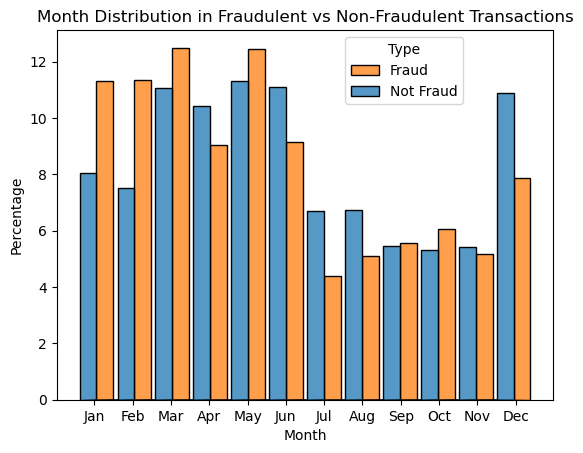

In [5]:
# Month vs Fraud
df['month']=pd.to_datetime(df['trans_date_trans_time']).dt.month
ax=sns.histplot(data=df, x="month", hue="is_fraud", common_norm=False,stat='percent',multiple='dodge',shrink=8)
ax.set_ylabel('Percentage')
ax.set_xlabel('Month')
plt.xticks(np.arange(1,13,1))
ax.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun","Jul",'Aug','Sep','Oct','Nov','Dec'])
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'],loc='upper center', bbox_to_anchor=(0.7,1))
plt.title('Month Distribution in Fraudulent vs Non-Fraudulent Transactions')

### Remarks:
Fraudulent transactions peak in January, February, March, and May, with March and May showing a notably higher percentage of fraud relative to non-fraudulent activities. Conversely, July and August have the lowest percentages of fraudulent transactions in comparison to the rest of the months.

C:\Users\TrucLe\AppData\Local\Temp\ipykernel_22484\770757513.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='Blues', fmt=".2f")


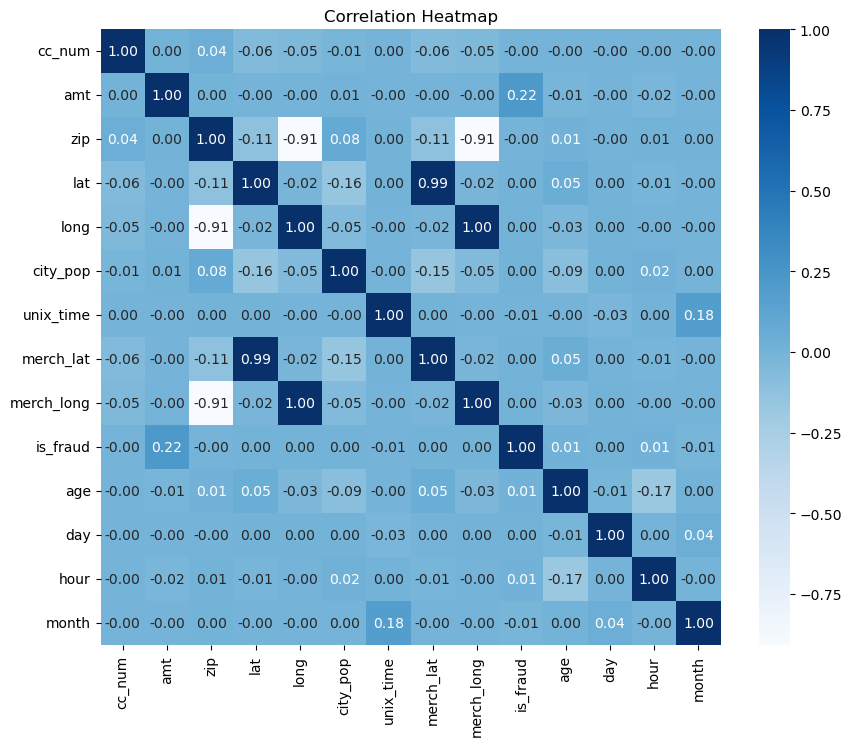

In [125]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='Blues', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

### Remarks:
- Have to remove feature: 'merch_long','merch_lat'as they have strong correlations with other features
- Have to remove: 'dob' as replaced by 'age'

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Baseline Model</b></font>

In [15]:
# Set max rows to None to display all columns without truncation
pd.set_option('display.max_columns', None)

# Reset the option back to default
# pd.reset_option('display.max_columns')

In [16]:
df

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,age,age_bin,age_bins,hour,day,month
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,35,"[35, 40)","[35, 40)",0,1,1
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,45,"[45, 50)","[45, 50)",0,1,1
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,61,"[60, 65)","[60, 65)",0,1,1
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,56,"[55, 60)","[55, 60)",0,1,1
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,37,"[35, 40)","[35, 40)",0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296670,2020-06-21 12:12:08,30263540414123,fraud_Reichel Inc,entertainment,15.56,Erik,Patterson,M,162 Jessica Row Apt. 072,Hatch,UT,84735,37.7175,-112.4777,258,Geoscientist,1961-11-24,440b587732da4dc1a6395aba5fb41669,1371816728,36.841266,-111.690765,0,62,"[60, 65)","[60, 65)",12,6,6
1296671,2020-06-21 12:12:19,6011149206456997,fraud_Abernathy and Sons,food_dining,51.70,Jeffrey,White,M,8617 Holmes Terrace Suite 651,Tuscarora,MD,21790,39.2667,-77.5101,100,"Production assistant, television",1979-12-11,278000d2e0d2277d1de2f890067dcc0a,1371816739,38.906881,-78.246528,0,44,"[40, 45)","[40, 45)",12,6,6
1296672,2020-06-21 12:12:32,3514865930894695,fraud_Stiedemann Ltd,food_dining,105.93,Christopher,Castaneda,M,1632 Cohen Drive Suite 639,High Rolls Mountain Park,NM,88325,32.9396,-105.8189,899,Naval architect,1967-08-30,483f52fe67fabef353d552c1e662974c,1371816752,33.619513,-105.130529,0,56,"[55, 60)","[55, 60)",12,6,6
1296673,2020-06-21 12:13:36,2720012583106919,"fraud_Reinger, Weissnat and Strosin",food_dining,74.90,Joseph,Murray,M,42933 Ryan Underpass,Manderson,SD,57756,43.3526,-102.5411,1126,Volunteer coordinator,1980-08-18,d667cdcbadaaed3da3f4020e83591c83,1371816816,42.788940,-103.241160,0,43,"[40, 45)","[40, 45)",12,6,6


In [17]:
# Subset the training data to include only the features that we need
cols_to_drop = ['trans_date_trans_time','trans_num','first','last','street','dob','age_bin']
train=df.drop(columns=cols_to_drop)
#convert category to dummy variables
train=pd.get_dummies(train, drop_first=True)
train_cols = train.columns
y_train=train['is_fraud'].values
X_train=train.drop("is_fraud", axis='columns').values

In [19]:
# Do the same to the testing dataset
test=pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTest.csv')
test['age']=dt.date.today().year-pd.to_datetime(test['dob']).dt.year
test['hour']=pd.to_datetime(test['trans_date_trans_time']).dt.hour
test['day']=pd.to_datetime(test['trans_date_trans_time']).dt.dayofweek
test['month']=pd.to_datetime(test['trans_date_trans_time']).dt.month
test_cols_to_drop = ['trans_date_trans_time','trans_num','first','last','street','dob']
test = test.drop(columns=test_cols_to_drop)
#convert category to dummy variables
test=pd.get_dummies(test, drop_first=True)
test=test.reindex(columns = train_cols, fill_value=0)
y_test=test['is_fraud'].values
X_test=test.drop("is_fraud", axis='columns').values

In [20]:
lr = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(random_state=42)

lr.fit(X_train, y_train)
dt.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)
y_pred_dt = dt.predict(X_test)

print('Logistic Regression')
# print(' Accuracy: ', lr.score(X_test, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_lr))
print(' Classification Report: ')
print(classification_report(y_test, y_pred_lr))

print('Decision Tree')
# print(' Accuracy: ', dt.score(X_test, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_dt))
print(' Classification Report: ')
print(classification_report(y_test, y_pred_dt))

C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression
 ROC AUC Score:  0.5
 Classification Report: 


C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 Classification Report:                precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.00      0.00      0.00      2145

    accuracy                           1.00    555719
   macro avg       0.50      0.50      0.50    555719
weighted avg       0.99      1.00      0.99    555719

Decision Tree
 ROC AUC Score:  0.8998737561469915
 Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.65      0.80      0.72      2145

    accuracy                           1.00    555719
   macro avg       0.83      0.90      0.86    555719
weighted avg       1.00      1.00      1.00    555719



<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Feature Engineering</b></font>
- Handle Outliers
- Do Custom and Column Transformer

In [9]:
# Handle outliers
df2 = df.copy()
columns_with_outliers = ['cc_num', 'amt', 'lat', 'long','city_pop']

for col in columns_with_outliers:
    Q1 = df2[col].quantile(0.25)
    Q3 = df2[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df2[col] = np.where(df2[col] < lower_bound, lower_bound, df2[col])
    df2[col] = np.where(df2[col] > upper_bound, upper_bound, df2[col])

In [24]:
# Custom and Column Transformer
categorical_cols = ['merchant','category','gender']
label_encode_cols = ['city','state','job']
numerical_cols = ['cc_num','amt','zip','lat','long','age','city_pop','unix_time','hour','day','month']

In [49]:
class CustomLabelEncoder(BaseEstimator, TransformerMixin):

    def __init__(self):
        self.le = LabelEncoder()

    def fit(self, X, y=None):
        # Add an 'unknown' class when fitting
        self.le.fit(np.append(X, 'unknown'))
        return self

    def transform(self, X, y=None):
        # Replace unseen labels with 'unknown'
        X_transformed = np.where(np.isin(X, self.le.classes_), X, 'unknown')
        return self.le.transform(X_transformed).reshape(-1, 1)
    
    def fit_transform(self, X, y=None):
        self.fit(X)
        return self.transform(X)

In [50]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ] + [('label_encode_' + col, CustomLabelEncoder(), col) for col in label_encode_cols]
)


In [51]:
features = ['merchant','category','gender','city','state','job','cc_num','amt','zip','lat','long',
           'age','city_pop','unix_time','hour','day','month','is_fraud']
train = df2[features]
test = pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTest.csv')
test['age']=dt.date.today().year-pd.to_datetime(test['dob']).dt.year
test['hour']=pd.to_datetime(test['trans_date_trans_time']).dt.hour
test['day']=pd.to_datetime(test['trans_date_trans_time']).dt.dayofweek
test['month']=pd.to_datetime(test['trans_date_trans_time']).dt.month
test = test[features]

In [53]:
# Create and evaluate the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])

X_train = train.drop(columns='is_fraud')
y_train = train['is_fraud']

pipeline.fit(X_train, y_train)

y_train_pred = pipeline.predict(X_train)

X_test = test.drop(columns='is_fraud')
y_test = test['is_fraud']
y_pred = pipeline.predict(X_test)

print('Train Accuracy:', accuracy_score(y_train, y_train_pred))
print('Test Accuracy:', accuracy_score(y_test, y_pred))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred))
print('Classification report:\n',classification_report(y_test, y_pred))


C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Train Accuracy: 0.8998882528760038
Test Accuracy: 0.8998882528760038
 ROC AUC Score:  0.7523827091364583
Classification report:
               precision    recall  f1-score   support

           0       1.00      0.90      0.95    553574
           1       0.02      0.60      0.04      2145

    accuracy                           0.90    555719
   macro avg       0.51      0.75      0.50    555719
weighted avg       0.99      0.90      0.94    555719



In [54]:
# Create and evaluate the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=5))
])

X_train = train.drop(columns='is_fraud')
y_train = train['is_fraud']

pipeline.fit(X_train, y_train)

y_train_pred = pipeline.predict(X_train)

X_test = test.drop(columns='is_fraud')
y_test = test['is_fraud']
y_pred = pipeline.predict(X_test)

print('Train Accuracy:', accuracy_score(y_train, y_train_pred))
print('Test Accuracy:', accuracy_score(y_test, y_pred))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred))
print('Classification report:\n',classification_report(y_test, y_pred))

Train Accuracy: 0.9965432169855628
Test Accuracy: 0.9965432169855628
 ROC AUC Score:  0.5663784699153052
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.82      0.13      0.23      2145

    accuracy                           1.00    555719
   macro avg       0.91      0.57      0.61    555719
weighted avg       1.00      1.00      1.00    555719



C:\Users\TrucLe\AppData\Local\Temp\ipykernel_10812\1124220556.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = combined_df.corr()


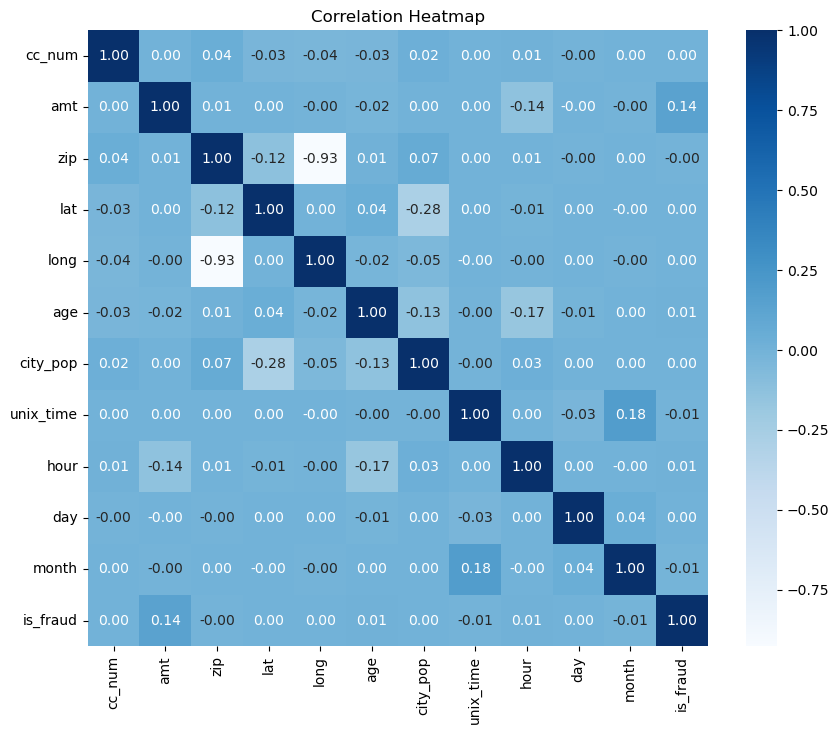

In [77]:
# Combine X_train and y_train into a single DataFrame
combined_df = pd.concat([X_train, y_train], axis=1)

# Compute the correlation matrix
correlation_matrix = combined_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Feature Selection</b></font>

- Since the target variable is_fraud is imbalanced, a good choice here might be the RandomForestClassifier, as ensemble methods like Random Forest tend to handle imbalances better than some other algorithms.
- Here we're using the SelectFromModel method which selects the important features based on the importance scores from a RandomForest classifier. It uses a median threshold by default, but this threshold can be adjusted based on your specific needs.

In [16]:
features = ['merchant','category','gender','city','state','job','cc_num','amt','zip','lat','long',
           'age','city_pop','unix_time','hour','day','month','is_fraud']
train = df2[features]
test = pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTest.csv')
test['age']=dt.date.today().year-pd.to_datetime(test['dob']).dt.year
test['hour']=pd.to_datetime(test['trans_date_trans_time']).dt.hour
test['day']=pd.to_datetime(test['trans_date_trans_time']).dt.dayofweek
test['month']=pd.to_datetime(test['trans_date_trans_time']).dt.month
test = test[features]

In [20]:
# Get dummies for the categorical columns
X_train = pd.get_dummies(train.drop(columns='is_fraud'))
y_train = train['is_fraud']
X_test = pd.get_dummies(test.drop(columns='is_fraud'))
y_test = test['is_fraud']

# Ensure the columns in the test set match with those in the training set
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Create the feature selection and model pipeline without the preprocessor
pipeline = Pipeline([
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=5))),
    ('classifier', DecisionTreeClassifier(random_state=5))
])

pipeline.fit(X_train, y_train)

# Get the feature selection step from the pipeline
selector = pipeline.named_steps['feature_selection']

# Get boolean mask for the selected features
selected_mask = selector.get_support()

# Use the mask to get the selected feature names
selected_names = X_train.columns[selected_mask]
print('Selected Features:', selected_names)

# Predict on training data
y_train_pred = pipeline.predict(X_train)

# Predict on test data
y_pred = pipeline.predict(X_test)

# Print results
print('Train Accuracy:', accuracy_score(y_train, y_train_pred))
print('Test Accuracy:', accuracy_score(y_test, y_pred))
print('ROC AUC Score:', roc_auc_score(y_test, y_pred))
print('Classification report:\n', classification_report(y_test, y_pred))


Selected Features: Index(['cc_num', 'amt', 'zip', 'lat', 'long', 'age', 'city_pop', 'unix_time',
       'hour', 'day',
       ...
       'job_Industrial buyer', 'job_Lawyer', 'job_Legal secretary',
       'job_Personnel officer', 'job_Prison officer', 'job_Quantity surveyor',
       'job_Sales promotion account executive',
       'job_Senior tax professional/tax inspector', 'job_Solicitor',
       'job_Trading standards officer'],
      dtype='object', length=175)
Train Accuracy: 1.0
Test Accuracy: 0.9963290799846685
ROC AUC Score: 0.8702168745832286
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.52      0.74      0.61      2145

    accuracy                           1.00    555719
   macro avg       0.76      0.87      0.80    555719
weighted avg       1.00      1.00      1.00    555719



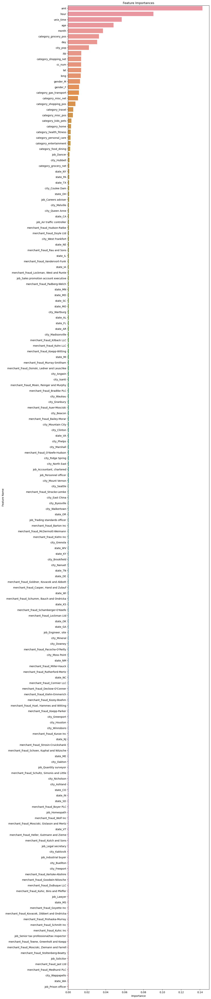

In [33]:
# Get feature importances from the RandomForestClassifier
feature_importances = selector.estimator_.feature_importances_

# Match importances with selected names
selected_importances = feature_importances[selected_mask]

# Create a DataFrame to visualize the importances
df_importances = pd.DataFrame({
    'Feature': selected_names,
    'Importance': selected_importances
})

# Sort the DataFrame based on the importances
df_importances = df_importances.sort_values(by="Importance", ascending=False)

# Plot
plt.figure(figsize=(10, len(selected_names) * 0.4))
sns.barplot(x='Importance', y='Feature', data=df_importances)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.show()


In [10]:
features_selected = ['amt', 'hour', 'unix_time', 'age', 'month', 'category', 'day', 'city_pop', 'zip', 'cc_num',
                     'lat', 'long', 'gender','is_fraud']

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Modeling & Parameter Tunning</b></font>

In [11]:
train = df2[features_selected]
#convert category to dummy variables
train=pd.get_dummies(train, drop_first=True)
test = pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTest.csv')
test['age']=dt.date.today().year-pd.to_datetime(test['dob']).dt.year
test['hour']=pd.to_datetime(test['trans_date_trans_time']).dt.hour
test['day']=pd.to_datetime(test['trans_date_trans_time']).dt.dayofweek
test['month']=pd.to_datetime(test['trans_date_trans_time']).dt.month
test = test[features_selected]
#convert category to dummy variables
test=pd.get_dummies(test, drop_first=True)

In [12]:
X_train = train.drop(columns='is_fraud')
y_train = train['is_fraud']

X_test = test.drop(columns='is_fraud')
y_test = test['is_fraud']

In [15]:
# Apply Decision Tree
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
dt_params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

dt_search = GridSearchCV(dt, dt_params, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)
dt_search.fit(X_train, y_train)

print(dt_search.best_params_)
dt_best = dt_search.best_estimator_


Fitting 3 folds for each of 72 candidates, totalling 216 fits
{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}


In [ ]:
# # Apply Support Vector Machine (SVM)
# svm = SVC(probability=True)
# svm.fit(X_train, y_train)
# svm_params = {
#     'C': [0.1, 1, 10],
#     'kernel': ['linear', 'rbf'],
#     'gamma': [0.1, 1, 'scale']
# }

# svm_search = GridSearchCV(svm, svm_params, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)
# svm_search.fit(X_train, y_train)

# print(svm_search.best_params_)
# svm_best = svm_search.best_estimator_

In [13]:
# Apply XGBoost
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train, y_train)
xgb_params = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
}

xgb_search = GridSearchCV(xgb_model, xgb_params, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)
xgb_search.fit(X_train, y_train)

print(xgb_search.best_params_)
xgb_best = xgb_search.best_estimator_

Fitting 3 folds for each of 27 candidates, totalling 81 fits
{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}


In [ ]:
# # Apply KNN
# knn = KNeighborsClassifier()
# knn.fit(X_train, y_train)
# knn_params = {
#     'n_neighbors': [3, 5, 7, 9],
#     'weights': ['uniform', 'distance'],
#     'metric': ['euclidean', 'manhattan']
# }

# knn_search = GridSearchCV(knn, knn_params, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)
# knn_search.fit(X_train, y_train)

# print(knn_search.best_params_)
# knn_best = knn_search.best_estimator_

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Model Stacking</b></font>

In [16]:
base_learners = [
    ('dt_best', dt_best),
    ('xgb_best', xgb_best),
]

stacked_model = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression())


<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Model Selection</b></font>

In [17]:
# Create a pipeline that applies SMOTE
pipeline = Pipeline([
    ('smote', SMOTE(random_state=5))
])

# Apply SMOTE on training data (assuming X_train has already been preprocessed)
X_train_resampled, y_train_resampled = pipeline.fit_resample(X_train, y_train)

# Assuming X_test has already been preprocessed
X_test_preprocessed = X_test

# Fitting base models
dt_best.fit(X_train_resampled, y_train_resampled)
xgb_best.fit(X_train_resampled, y_train_resampled)

# Fitting stacked model
stacked_model.fit(X_train_resampled, y_train_resampled)

# Evaluating models
models = [dt_best, xgb_best, stacked_model]
model_names = ['Decision Tree', 'XGBoost', 'Stacked Model']

for model, name in zip(models, model_names):
    y_train_pred = model.predict(X_train_resampled)
    y_pred = model.predict(X_test_preprocessed)
    print(f"Train Accuracy for {name}: ", accuracy_score(y_train_resampled, y_train_pred))
    print(f"Test Accuracy for {name}: ", accuracy_score(y_test, y_pred))
    print(f"ROC AUC for {name}: ", roc_auc_score(y_test, y_pred))
    print(f"Classification report for {name}:\n", classification_report(y_test, y_pred))

Train Accuracy for Decision Tree:  0.8755954417147791
Test Accuracy for Decision Tree:  0.9323614992469216
ROC AUC for Decision Tree:  0.9012667398861476
Classification report for Decision Tree:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96    553574
           1       0.05      0.87      0.09      2145

    accuracy                           0.93    555719
   macro avg       0.52      0.90      0.53    555719
weighted avg       1.00      0.93      0.96    555719

Train Accuracy for XGBoost:  0.961929351388375
Test Accuracy for XGBoost:  0.9382403696832392
ROC AUC for XGBoost:  0.9053785499462139
Classification report for XGBoost:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97    553574
           1       0.05      0.87      0.10      2145

    accuracy                           0.94    555719
   macro avg       0.53      0.91      0.53    555719
weighted avg       1.00      0.94 

In [139]:
# Subset the training data to include only the features that we need
train=df[['category','amt','zip','lat','long','city_pop','age','gender','hour','day','month','is_fraud']]
#convert category to dummy variables
train=pd.get_dummies(train, drop_first=True)
train_cols = train.columns
y_train=train['is_fraud'].values
X_train=train.drop("is_fraud", axis='columns').values

In [141]:
# Do the same to the testing dataset
test=pd.read_csv('D:\\1. Studying\\4. Online Learning\\WeCloudData\\Data Science_Assignments & Tests\\Data Science_Portfolio Project\\Dataset\\Credit Card Transactions Fraud Detection Dataset\\fraudTest.csv')
test['age']=dt.date.today().year-pd.to_datetime(test['dob']).dt.year
test['hour']=pd.to_datetime(test['trans_date_trans_time']).dt.hour
test['day']=pd.to_datetime(test['trans_date_trans_time']).dt.dayofweek
test['month']=pd.to_datetime(test['trans_date_trans_time']).dt.month
test=test[['category','amt','zip','lat','long','city_pop','age','gender','hour','day','month','is_fraud']]
#convert category to dummy variables
test=pd.get_dummies(test, drop_first=True)
test=test.reindex(columns = train_cols, fill_value=0)
y_test=test['is_fraud'].values
X_test=test.drop("is_fraud", axis='columns').values

In [142]:
method= SMOTE()
X_resampled, y_resampled = method.fit_resample(X_train, y_train)
model=LogisticRegression(random_state=42)
model.fit(X_resampled,y_resampled)
y_pred_lr=model.predict(X_test)
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_lr))
print('Classification report:\n', classification_report(y_test, y_pred_lr))
conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred_lr)
print('Confusion matrix:\n', conf_mat)
print('Share of Non-Fraud in Test Data:', 1-round(y_test.sum()/len(y_test),4))

 ROC AUC Score:  0.8487918255083982
Classification report:
               precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.05      0.75      0.10      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.85      0.53    555719
weighted avg       1.00      0.95      0.97    555719

Confusion matrix:
 [[523977  29597]
 [   534   1611]]
Share of Non-Fraud in Test Data: 0.9961


In [144]:
model2 = RandomForestClassifier(random_state=5)
model2.fit(X_resampled,y_resampled)
y_pred_rf=model2.predict(X_test)
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_rf))
print('Classification report:\n', classification_report(y_test, y_pred_rf))
conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred_rf)
print('Confusion matrix:\n', conf_mat)
print('Share of Non-Fraud in Test Data:', 1-round(y_test.sum()/len(y_test),4))

 ROC AUC Score:  0.8511790840184154
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.93      0.70      0.80      2145

    accuracy                           1.00    555719
   macro avg       0.96      0.85      0.90    555719
weighted avg       1.00      1.00      1.00    555719

Confusion matrix:
 [[553460    114]
 [   638   1507]]
Share of Non-Fraud in Test Data: 0.9961


### Remarks:
Optimizing for ROC AUC score and recall: choosing XGBoost
- ROC AUC is a better metric in this imbalanced dataset because it evaluates the model's ability to discriminate between the positive and negative classes irrespective of the threshold.
- Recall refers to a model's capability to identify all pertinent instances in a dataset, calculated as the ratio of true positives to the sum of true positives and false negatives.

- For scenarios with significant implications, like cancer detection, recall typically outweighs precision in importance.

- When detecting credit card fraud, minimizing false negatives is crucial. Overlooking a fraudulent transaction can be costly, making it essential to intercept such activities. A false negative implies a fraudulent transaction is deemed legitimate, which is harmful. While false positives (labeling a legitimate transaction as fraudulent) matter, averting fraud takes precedence.

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Model Interpretation</b></font>

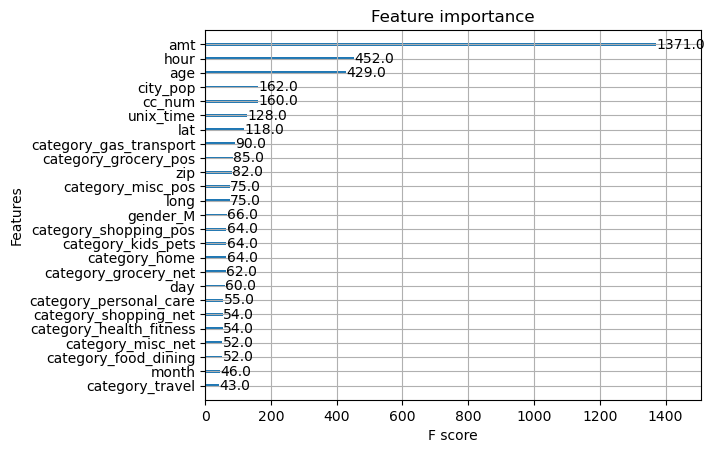

In [18]:
# Display feature importance
xgb.plot_importance(xgb_best)
plt.show()

<Figure size 60000x100000 with 0 Axes>

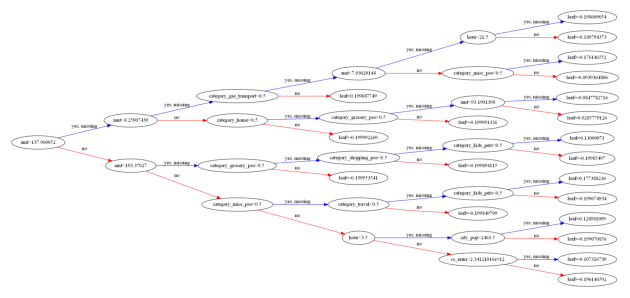

In [64]:
# Plot the first tree
plt.figure(figsize=(600, 1000), dpi=100)  
xgb.plot_tree(xgb_best, num_trees=0, rankdir='LR') 
plt.tight_layout()
plt.show()

In [30]:
# Create a SHAP explainer object
explainer = shap.Explainer(xgb_best)
shap_values = explainer.shap_values(X_train)

# Plot SHAP values for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

<a id="1"></a>
<font color="#33AAFBD" size=+2.5><b>Deep Learning</b></font>

In [67]:
# Define a pipeline only for SMOTE
pipeline_smote = Pipeline([
    ('smote', SMOTE(random_state=5)),
])

# Apply SMOTE on your data
X_train_resampled, y_train_resampled = pipeline_smote.fit_resample(X_train, y_train)

# Convert DataFrames to numpy arrays and then reshape for CNN
X_train_reshaped = X_train_resampled.values.reshape(X_train_resampled.shape[0], X_train_resampled.shape[1], 1)
X_test_reshaped = X_test.values.reshape(X_test.shape[0], X_test.shape[1], 1)

# Build the 1D CNN model
model = Sequential()
model.add(Conv1D(32, 2, activation='relu', input_shape=X_train_reshaped.shape[1:]))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_reshaped, y_train_resampled, epochs=14, batch_size=64, validation_data=(X_test_reshaped, y_test))

# Evaluate the model
y_pred = (model.predict(X_test_reshaped) > 0.5).astype(int).flatten()
print(f"Test Accuracy: ", accuracy_score(y_test, y_pred))
print(f"ROC AUC: ", roc_auc_score(y_test, y_pred))
print(f"Classification report:\n", classification_report(y_test, y_pred))


Epoch 1/14
40287/40287 [==============================] - 131s 3ms/step - loss: 262790414336.0000 - accuracy: 0.5676 - val_loss: 0.3512 - val_accuracy: 0.8795
Epoch 2/14
40287/40287 [==============================] - 129s 3ms/step - loss: 9994549.0000 - accuracy: 0.8379 - val_loss: 0.2287 - val_accuracy: 0.9227
Epoch 3/14
40287/40287 [==============================] - 130s 3ms/step - loss: 12310081.0000 - accuracy: 0.8443 - val_loss: 0.2992 - val_accuracy: 0.9090
Epoch 4/14
40287/40287 [==============================] - 132s 3ms/step - loss: 2465754.5000 - accuracy: 0.8463 - val_loss: 0.3996 - val_accuracy: 0.8584
Epoch 5/14
40287/40287 [==============================] - 131s 3ms/step - loss: 4586787.5000 - accuracy: 0.8479 - val_loss: 0.2464 - val_accuracy: 0.9250
Epoch 6/14
40287/40287 [==============================] - 133s 3ms/step - loss: 12200134.0000 - accuracy: 0.8466 - val_loss: 0.3793 - val_accuracy: 0.8753
Epoch 7/14
40287/40287 [==============================] - 130s 3ms/st